<img src="https://www.anped.org.br/sites/default/files/images/ufcg-lateral.png" width="780" height="240" align="center"/>

## Centro de Engenharia Elétrica e Informática
## Departamento de Engenharia Elétrica
## Disciplina: <span style="color:red">Int. ao Processamento de Imagem Digital e Visão Computacional</span>
## Professora: <span style="color:red">Luciana Veloso</span>
## Aluno(a): <span style="color:red">Alysson Machado de Oliveira Barbosa</span>

# Desafio Prático de PDI
***

## 1. Entendimento do Problema
***

Problemas de classificação são uma aplicação bastante comum de algoritmos de aprendizagem de máquina, onde Redes Neurais tendem a se destacar sobretudo quando são utilizados dados não estruturados. Nesse tipo de problema, os exemplos são divididos em classes e cada classe é associada a um número inteiro. Nesse contexto, a função do classificador é associar cada exemplo de entrada à sua respectiva classe. Algumas tarefas de classificação são a identificação da presença de pessoas em uma imagem, a presença de anomalias em exames médicos ou ainda a identificação de componentes com defeito na linha de produção.

Nessa tarefa, espera-se a concepção de um modelo de Aprendizagem de Máquina capaz de classificar uma dada imagem quanto à presença de cães ou gatos. Para isso, será utilizado o banco de dados [Cats and Dogs Breeds Classification Oxford Dataset](https://www.kaggle.com/zippyz/cats-and-dogs-breeds-classification-oxford-dataset), que contém mais de 7 mil imagens de cães e gatos de raças diversas. Nesse banco de dados, as imagens de gatos têm seu nome iniciado com letra maiúscula (i.e. **Abyssinian_34.jpg**) e as imagens de cães têm o nome iniciado com letra minúscula (i.e. **beagle_1.jpg**). O banco de dados pode ser acessado a partir da plataforma Kaggle a partir do link acima.

![image](https://user-images.githubusercontent.com/58775072/135732970-1a289478-c9e6-460c-a16f-e19279a39182.png)
> **Figura**: Imagens do banco de dados utilizado.

## 2. Atividades a Serem Desenvolvidas
***

1. Escreva um algoritmo em Python que realize o treinamento de um modelo para a classificação de imagens quanto à presença de cães ou gatos.
2. Apesar de o dataset ser dividido em classes para cada raça de cão/gato, só é necessário determinar se a imagem contém um cão ou um gato.
3. Use quantas imagens precisar, mas atente-se à divisão da própria base de dados quanto aos conjuntos de treino e teste.
4. Atente-se a um código limpo, organizado, documentado e com ideias claras da solução proposta.
5. Caso mais de um modelo seja produzido, comente sobre os resultados obtidos, explicitando qual deles funcionou melhor e o porquê.
6. Na falta de uma GPU para o treinamento, recomenda-se o uso do Kaggle ou do Google Colab.

## 3. Importação dos Pacotes
***

In [1]:
# funções úteis para construção da rede neural convolucional
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from sklearn.model_selection import train_test_split
from tensorflow.python.keras.utils.vis_utils import plot_model
import pandas as pd

# funções auxiliares para construção dos algoritmos
import os  
import urllib.request as url
from zipfile import ZipFile
import random
import tarfile

# funções úteis para visualizar graficamente os resultados
import seaborn as sn
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.cm as cm
from IPython.display import Image, display

# funções úteis para validar o desempenho do algoritmo
from sklearn.metrics import confusion_matrix
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# importando do repositório as funções do grad-cam
link = 'https://raw.githubusercontent.com/Alyssonmach/grad-cam-implementation/main/assets/grad_cam.py'
file_ = 'grad_cam.py'
url.urlretrieve(link, file_)

from grad_cam import make_gradcam_heatmap

## 4. Baixando os Dados do Kaggle
***

- [Cats and Dogs Breeds Classification Oxford Dataset](https://www.kaggle.com/zippyz/cats-and-dogs-breeds-classification-oxford-dataset)

In [3]:
# baixando as imagens do kaggle e armazenando em um arquivo compactado
url.urlretrieve('https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz', 'images.tar.gz')

# extraindo os arquivos baixados
t = tarfile.open("/content/images.tar.gz")
t.extractall('/content/')

## 5. Organizando o Dataframe
***

In [47]:
# carregando em uma lista os nomes dos arquivos
image_files = os.listdir('/content/images')

# removendo arquivos inconsistentes do conjunto de dados
index = list()
for i in range(0, len(image_files)):
  if image_files[i].split('.')[1] != 'jpg':
    index.append(i)

for i in range(0, len(index)):
  image_files.pop(index[i] - i)

In [52]:
# rotulando a lista de imagens obtidas: 0 - gato / 1 - cachorro
labels = list()
for image in image_files:
    if image[0].isupper():
        labels.append(0)
    else:
        labels.append(1)

# aplicando o one_hot_encoder nos rótulos dos dados
labels = np.array(labels)
labels_one_hot = tf.keras.utils.to_categorical(labels, num_classes = 2, dtype = np.float32())

In [53]:
# organizando o dataframe em um arquivo csv
dataframe = pd.DataFrame(image_files, columns=['Path'])
dataframe['Cats'] = labels_one_hot[:, 0]
dataframe['Dogs'] = labels_one_hot[:, 1]
dataframe.to_csv('cats_and_dogs.csv')

In [54]:
# visualizando a quantidade de dados disponíveis no dataframe
print('Rotulações positivas para a classe gato:')
print(dataframe['Cats'].value_counts())
print('--\nRotulações positivas para a classe cachorro:')
print(dataframe['Dogs'].value_counts())

Rotulações positivas para a classe gato:
0.0    4990
1.0    2400
Name: Cats, dtype: int64
--
Rotulações positivas para a classe cachorro:
1.0    4990
0.0    2400
Name: Dogs, dtype: int64


## 6. Balanceamento dos Dados
***

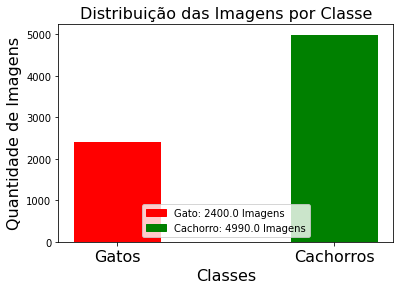

In [55]:
# visualizando a distribuição de imagens por classe
lenght_images = [np.sum(labels_one_hot[:,0]), np.sum(labels_one_hot[:,1])]
index = np.arange(0,2)
plt.bar(index, lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size=16)
plt.ylabel('Quantidade de Imagens', size=16)
plt.title('Distribuição das Imagens por Classe', size=16)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size=16)
cat = mpatches.Patch(color='red', label='Gato: '+str(lenght_images[0])+' Imagens')
dog = mpatches.Patch(color='green', label='Cachorro: '+str(lenght_images[1])+' Imagens')
plt.legend(handles=[cat, dog], loc='lower center')

In [56]:
# balanceando a quantidade de dados disponíveis no dataframe (oversampling)
cats_df1 = dataframe[dataframe['Cats'] == 1]
dogs_df = dataframe[dataframe['Dogs'] == 1]
cats_df2 = cats_df1.sample(n = (len(dogs_df) - len(cats_df1)) // 2)
cats_df3 = cats_df1.sample(n = (len(dogs_df) - len(cats_df1)) // 2)

# organizando o dataframe balanceado  
cats_df = pd.concat((cats_df1, cats_df2, cats_df3))
dataframe_balanced = pd.concat((cats_df, dogs_df))

# salvando o dataframe balanceado em um arquivo csv 
dataframe_balanced.to_csv('cats_and_dogs_oversampling.csv')

Text(0.5, 0.98, 'Estratégia Utilizada: Ovesampling')

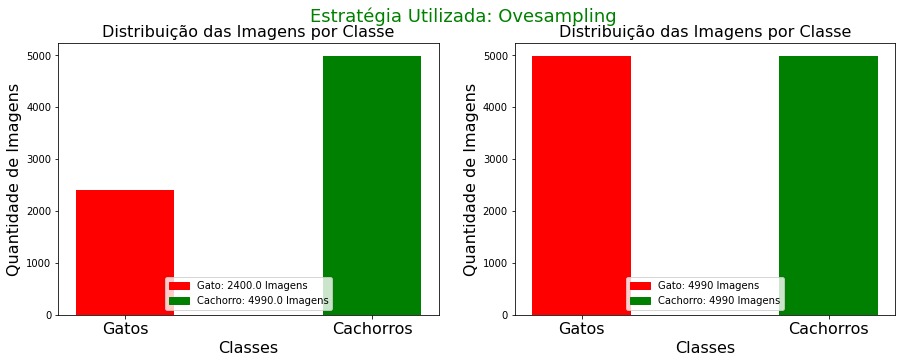

In [172]:
plt.figure(figsize = (15, 5))
# visualizando a distribuição de imagens por classe
plt.subplot(1, 2, 1)
lenght_images = [np.sum(labels_one_hot[:,0]), np.sum(labels_one_hot[:,1])]
index = np.arange(0,2)
plt.bar(index, lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size=16)
plt.ylabel('Quantidade de Imagens', size=16)
plt.title('Distribuição das Imagens por Classe', size=16)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size=16)
cat = mpatches.Patch(color='red', label='Gato: '+str(lenght_images[0])+' Imagens')
dog = mpatches.Patch(color='green', label='Cachorro: '+str(lenght_images[1])+' Imagens')
plt.legend(handles=[cat, dog], loc='lower center')

# visualizando a distribuição de imagens por classe após o balanceamento
plt.subplot(1, 2, 2)
lenght_images = [cats_df.shape[0], dogs_df.shape[0]]
index = np.arange(0,2)
plt.bar(index, lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size=16)
plt.ylabel('Quantidade de Imagens', size=16)
plt.title('Distribuição das Imagens por Classe', size=16)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size=16)
cat = mpatches.Patch(color='red', label='Gato: '+str(lenght_images[0])+' Imagens')
dog = mpatches.Patch(color='green', label='Cachorro: '+str(lenght_images[1])+' Imagens')
plt.legend(handles=[cat, dog], loc='lower center')

plt.suptitle('Estratégia Utilizada: Ovesampling', size = 18, color = 'green')

## 7. Visualizando as Imagens do Conjunto de Dados
***

### 7.1. Imagens dos Gatos 
***

Text(0.5, 0.98, 'Imagens Originais da Classe Gato')

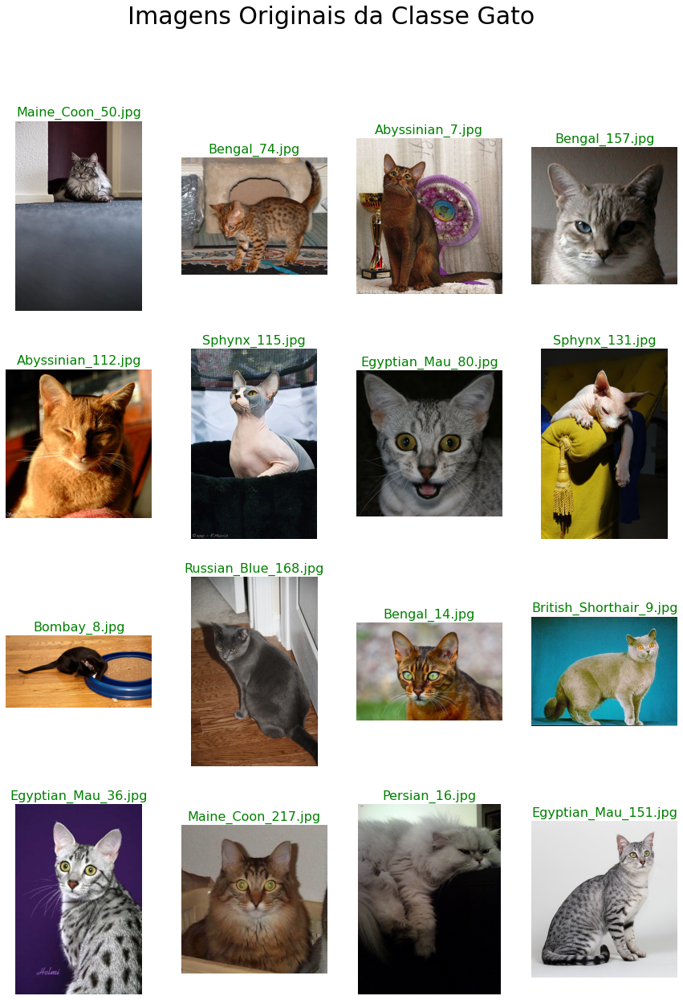

In [58]:
# visualizando as imagens da classe gato
cats_images = np.array(cats_df['Path'])
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 20))
for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 4989)
        image = plt.imread('/content/images/'+cats_images[count])
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(cats_images[count], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12)
        axs[i, j].axis('off')

plt.suptitle('Imagens Originais da Classe Gato', size = 30)

### 7.2. Imagens dos Cachorros 
***

Text(0.5, 0.98, 'Imagens Originais da Classe Cachorro')

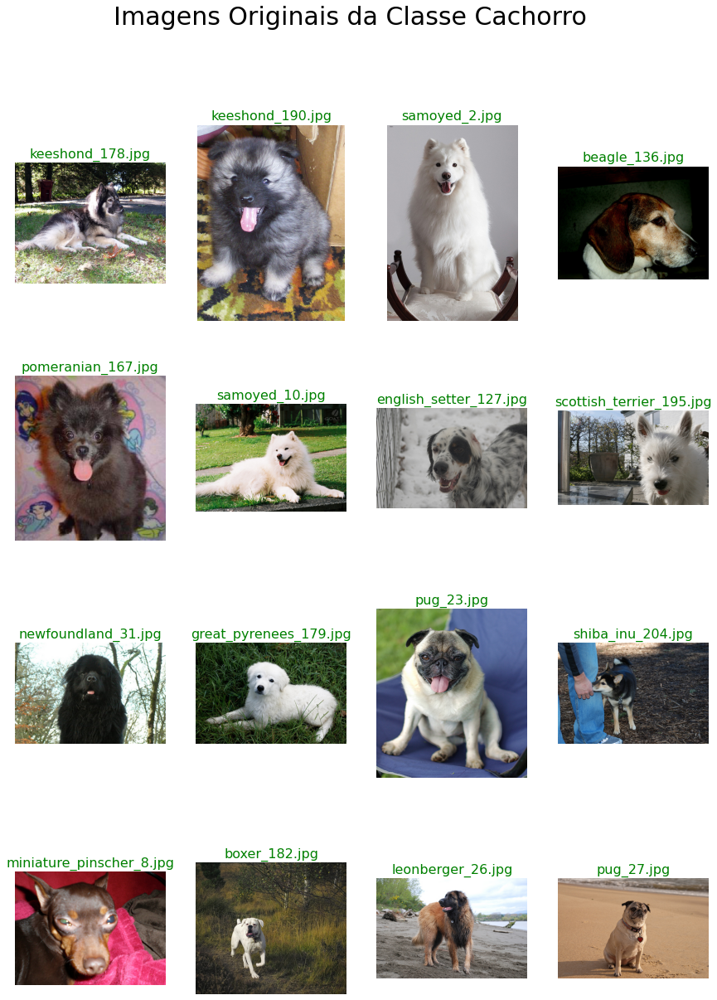

In [59]:
# visualizando as imagens da classe cachorro
dogs_images = np.array(dogs_df['Path'])
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 20))
for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 4989)
        image = plt.imread('/content/images/' + dogs_images[count])
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(dogs_images[count], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12)
        axs[i, j].axis('off')

plt.suptitle('Imagens Originais da Classe Cachorro', size = 30)

## 8. Particionando o Conjunto de Dados
***

In [60]:
# particionando o conjunto de dados em treino, validação e teste
train_df, test_df = train_test_split(dataframe_balanced, train_size = 0.8, random_state = 42, shuffle = True, 
                                     stratify = dataframe_balanced['Cats'])
test_df, val_df = train_test_split(test_df, test_size = 0.5, random_state = 42, shuffle = True, 
                                   stratify = test_df['Cats'])

In [61]:
# visualizando a quantidade de dados disponíveiso para cada um dos dados
print('Distribuição dos Dados nos Conjuntos de Análise:\n--')
print('Dimensão do DataFrame de Treino: ', train_df.shape)
print('Dimensão do DataFrame de Validação: ', val_df.shape)
print('Dimensão do DataFrame de Teste: ', test_df.shape)

Distribuição dos Dados nos Conjuntos de Análise:
--
Dimensão do DataFrame de Treino:  (7984, 3)
Dimensão do DataFrame de Validação:  (998, 3)
Dimensão do DataFrame de Teste:  (998, 3)


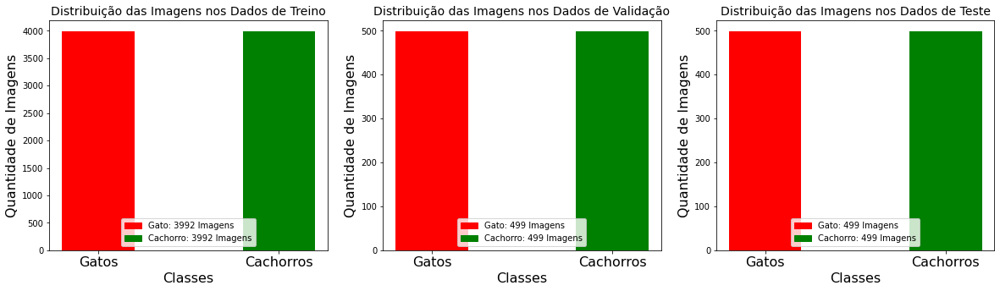

In [62]:
plt.figure(figsize=(20,5))
plt.subplot(1, 3, 1)

# visualizando a distribuição de imagens nos dados de treino por classe após o balanceamento
lenght_images = np.array(train_df['Cats'].value_counts())
index = np.arange(0,2)
plt.bar(index, lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size=16)
plt.ylabel('Quantidade de Imagens', size=16)
plt.title('Distribuição das Imagens nos Dados de Treino', size=14)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size=16)
cat = mpatches.Patch(color='red', label='Gato: '+str(lenght_images[0])+' Imagens')
dog = mpatches.Patch(color='green', label='Cachorro: '+str(lenght_images[1])+' Imagens')
plt.legend(handles=[cat, dog], loc='lower center')

plt.subplot(1, 3, 2)
# visualizando a distribuição de imagens nos dados de validação por classe após o balanceamento
lenght_images = np.array(val_df['Cats'].value_counts())
index = np.arange(0,2)
plt.bar(index, lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size=16)
plt.ylabel('Quantidade de Imagens', size=16)
plt.title('Distribuição das Imagens nos Dados de Validação', size=14)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size=16)
cat = mpatches.Patch(color='red', label='Gato: '+str(lenght_images[0])+' Imagens')
dog = mpatches.Patch(color='green', label='Cachorro: '+str(lenght_images[1])+' Imagens')
plt.legend(handles=[cat, dog], loc='lower center')


plt.subplot(1, 3, 3)
# visualizando a distribuição de imagens nos dados de teste por classe após o balanceamento
lenght_images = np.array(test_df['Cats'].value_counts())
index = np.arange(0,2)
plt.bar(index, lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size=16)
plt.ylabel('Quantidade de Imagens', size=16)
plt.title('Distribuição das Imagens nos Dados de Teste', size=14)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size=16)
cat = mpatches.Patch(color='red', label='Gato: '+str(lenght_images[0])+' Imagens')
dog = mpatches.Patch(color='green', label='Cachorro: '+str(lenght_images[1])+' Imagens')
plt.legend(handles=[cat, dog], loc='lower center')

## 9. Preparando o Gerador de Imagens (com Aumento de Dados)
***

In [132]:
# definindo os procedimentos de aumentos de dados a serem utilizados nos dados de treino e teste 
data_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.,
                                                            shear_range = 0.1,
                                                            zoom_range = 0.25, 
                                                            rotation_range = 16, 
                                                            horizontal_flip = True, 
                                                            width_shift_range = 0.1, 
                                                            height_shift_range = 0.1, 
                                                            fill_mode = 'constant')
original_data = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

In [133]:
# construindo os geradores de imagens para os dados de treinamento a partir das informações no dataframe
train_generator = data_augmentation.flow_from_dataframe(train_df, 
                                                         directory = '/content/images/',
                                                         x_col = 'Path', y_col = ['Cats', 'Dogs'], 
                                                         target_size = (128, 128), color_mode = 'rgb', 
                                                         class_mode = 'raw', batch_size = 64, 
                                                         shuffle = True, seed = 42) 

Found 7984 validated image filenames.


In [134]:
# construindo o gerador de imagens para os dados de validação a partir das informações no dataframe
validation_generator = original_data.flow_from_dataframe(val_df, 
                                                        directory = '/content/images/',
                                                        x_col = 'Path', y_col = ['Cats', 'Dogs'], 
                                                        target_size = (128, 128), color_mode = 'rgb', 
                                                        class_mode = 'raw', batch_size = 64, 
                                                        shuffle = True, seed = 42) 

Found 998 validated image filenames.


In [135]:
# construindo o gerador de imagens para os dados de validação a partir das informações no dataframe
test_generator = original_data.flow_from_dataframe(test_df, 
                                                   directory = '/content/images/',
                                                   x_col = 'Path', y_col = ['Cats', 'Dogs'], 
                                                   target_size = (128, 128), color_mode = 'rgb', 
                                                   class_mode = 'raw', batch_size = 64, 
                                                   shuffle = True, seed = 42) 

Found 998 validated image filenames.


In [77]:
def encode(label):
  '''Função que rotula as imagens a partir das saídas one_hot'''
  
  if label == 0:
    return 'Gato'
  
  return 'Cachorro'

Text(0.5, 0.98, 'Imagens da Base de Dados de Treinamento')

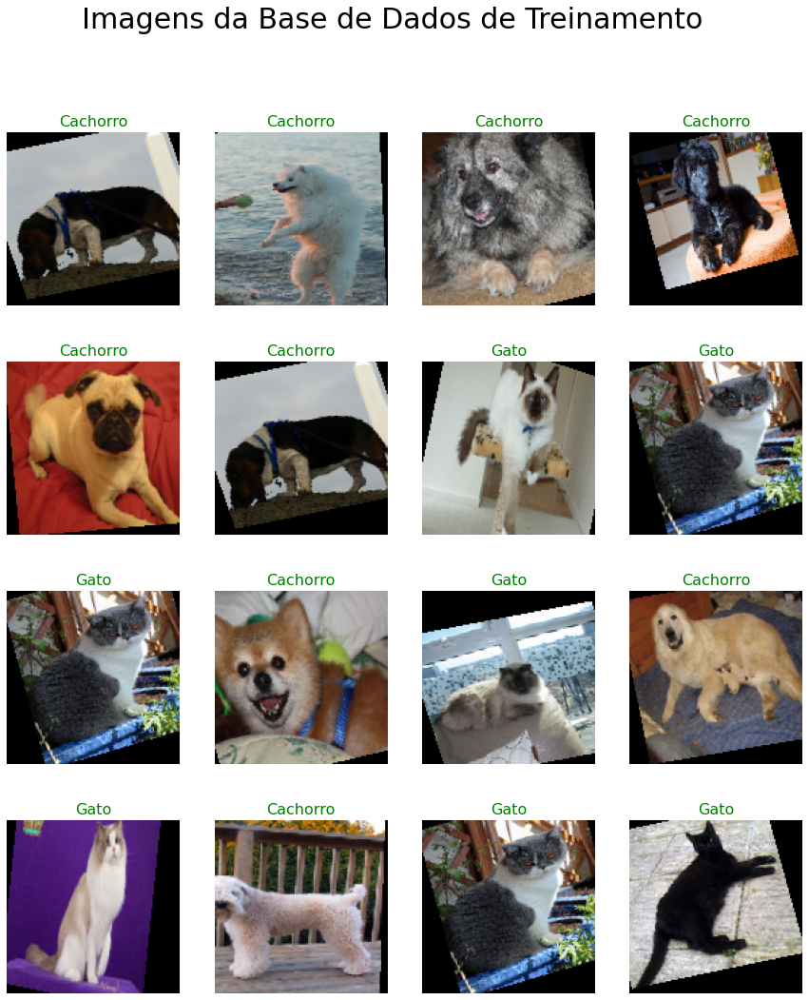

In [138]:
# obtendo uma amostra dos dados de treinamento para visualização gráfica
x, y = train_generator[random.randrange(0, len(train_generator))]

# visualizando as imagens com o aumento de dados
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 17))
for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 64)
        image = x[count]
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(encode(np.argmax(y[count])), size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12)
        axs[i, j].axis('off')

plt.suptitle('Imagens da Base de Dados de Treinamento', size = 30)

Text(0.5, 0.98, 'Imagens da Base de Dados de Validação')

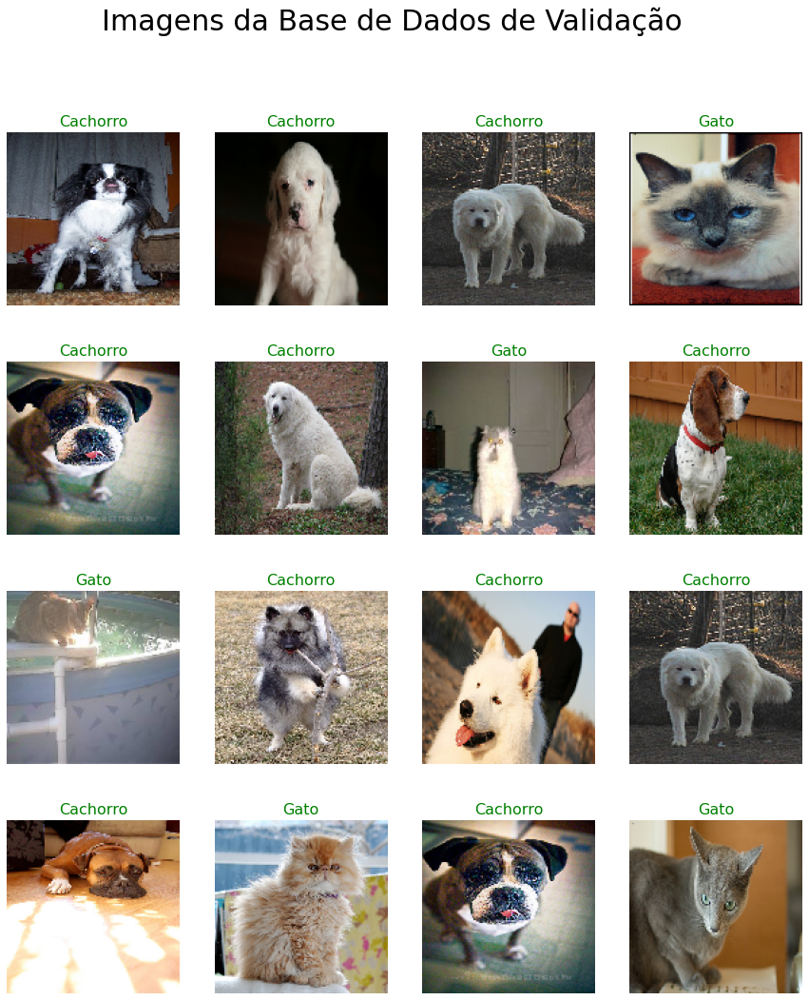

In [139]:
# obtendo uma amostra dos dados de treinamento para visualização gráfica
x, y = validation_generator[random.randrange(0, len(validation_generator))]

# visualizando as imagens com o aumento de dados
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 17))
for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 64)
        image = x[count]
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(encode(np.argmax(y[count])), size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12)
        axs[i, j].axis('off')

plt.suptitle('Imagens da Base de Dados de Validação', size = 30)

Text(0.5, 0.98, 'Imagens da Base de Dados de Teste')

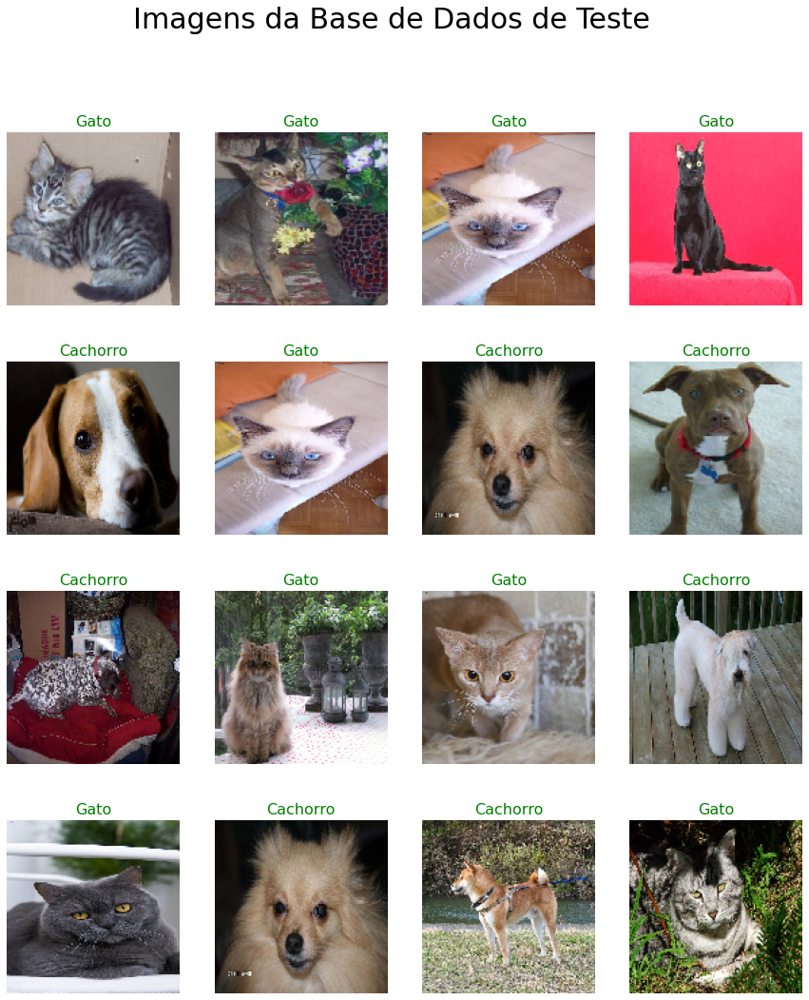

In [140]:
# obtendo uma amostra dos dados de treinamento para visualização gráfica
x, y = test_generator[random.randrange(0, len(test_generator))]

# visualizando as imagens com o aumento de dados
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 17))
for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 64)
        image = x[count]
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(encode(np.argmax(y[count])), size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12)
        axs[i, j].axis('off')

plt.suptitle('Imagens da Base de Dados de Teste', size = 30)

## 10. Preparando a Rede Neural Convolucional (ChiuauaNet)
***

In [90]:
def convs_layers(input_shape):
    '''Função que organiza as camadas de convolução da rede '''
    
    # camada de entrada da rede
    input_layer = tf.keras.layers.Input(shape = input_shape)
    # camada convolucional com 32 filtros, kernel 3x3 e função de ativação relu
    x = tf.keras.layers.Conv2D(filters = 32, kernel_size = (3, 3), activation = 'relu')(input_layer)
    # camada de pooling com kernel 2x2
    x = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(x)

    # camada convolucional com 64 filtros, kernel 2x2 e função de ativação relu
    x = tf.keras.layers.Conv2D(filters = 64, kernel_size = (2, 2), activation = 'relu')(x)
    # camada de pooling com kernel 2x2
    x = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(x)
    
    # camada convolucional com 128 filtros, kernel 2x2 e função de ativação relu
    x = tf.keras.layers.Conv2D(filters = 128, kernel_size = (2, 2), activation = 'relu')(x)
    # camada de pooling com kernel 2x2
    x = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(x)

    # camada convolucional com 256 filtros, kernel 2x2 e função de ativação relu
    x = tf.keras.layers.Conv2D(filters = 256, kernel_size = (2, 2), activation = 'relu')(x)
    # camada de pooling com kernel 2x2
    x = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(x)

    return input_layer, x 

In [91]:
def dense_layers(convs):
    '''Função que organiza as camadas densas da rede'''

    # camada de achatamento da rede 
    x = tf.keras.layers.Flatten()(convs)
    # camada densa com 256 neurônios e função de ativação relu
    x = tf.keras.layers.Dense(units = 256, activation = 'relu')(x)
    # camada densa com 128 neurônios e função de ativação relu
    x = tf.keras.layers.Dense(units = 128, activation = 'relu')(x)
    # camada densa com 64 neurônios e função de ativação relu
    x = tf.keras.layers.Dense(units = 64, activation = 'relu')(x)
    # camada de dropout com taxa de zeramento de 20,0%
    x = tf.keras.layers.Dropout(rate = 0.2)(x)
    # camada de saída com 2 neurônios e função de ativação softmax
    x = tf.keras.layers.Dense(units = 2, activation = 'softmax')(x)
    
    return x

In [92]:
def final_model(input_shape):
    '''Função que organiza a rede neural convolucional'''
    
    input_layer, convs = convs_layers(input_shape)
    output_layer = dense_layers(convs)
    
    return tf.keras.models.Model(inputs = input_layer, outputs = output_layer)

In [129]:
# organizando o modelo de rede neural convolucional com dimensão de entrada (128, 128, 3)
model = final_model((128, 128, 3))
# visualizando um resumo do modelo construído
model.summary() 

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 62, 62, 64)        8256      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 31, 31, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 30, 30, 128)       32896     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 15, 15, 128)       0   

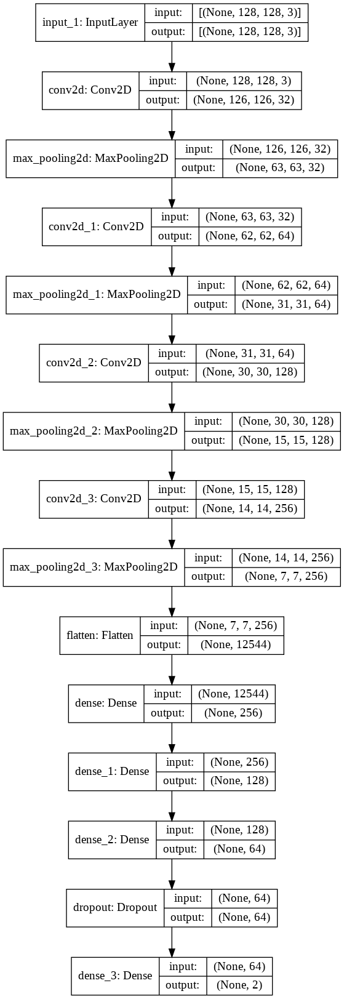

In [94]:
# visualizando gráficamente a arquitetura construída
plot_model(model, to_file='model.png', show_shapes = True)

In [95]:
def compile(model):
    ''''Função que define os hiperparâmetros de compilação da rede'''

    model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['acc'])

    return model

In [130]:
# compilando os hiperparâmetros da rede
model = compile(model)

## 11. Organizando os Callbacks
***

In [131]:
# configurando um callback para salvar as informações de treinamento em um arquivo csv
csv_history = tf.keras.callbacks.CSVLogger('history_train_oversampling.csv', separator = ',', append = False)

# configurando um callback para salvar os melhores pesos obtidos no treinamento da rede
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights_oversampling.hdf5', monitor=  'val_acc', 
                                                verbose = True, save_best_only =True, 
                                                save_weights_only = True, mode = 'max')

# configurando uma lista de callbacks da rede
callbacks = [csv_history, checkpoint]

## 12. Treinamento da Rede
***

In [136]:
# treinando o modelo construído usando os geradores de imagem
model.fit(train_generator, batch_size = 64, epochs = 50, verbose = True, 
          callbacks = callbacks, validation_data = validation_generator, shuffle = True, 
          validation_batch_size = 64, use_multiprocessing = True, workers = 4)

Epoch 1/50
125/125 [==============================] - 28s 215ms/step - loss: 0.6873 - acc: 0.5509 - val_loss: 0.6239 - val_acc: 0.6743

Epoch 00001: val_acc improved from -inf to 0.67435, saving model to weights_oversampling.hdf5
Epoch 2/50
125/125 [==============================] - 27s 214ms/step - loss: 0.6256 - acc: 0.6559 - val_loss: 0.5713 - val_acc: 0.7094

Epoch 00002: val_acc improved from 0.67435 to 0.70942, saving model to weights_oversampling.hdf5
Epoch 3/50
125/125 [==============================] - 28s 217ms/step - loss: 0.5870 - acc: 0.6899 - val_loss: 0.5475 - val_acc: 0.7034

Epoch 00003: val_acc did not improve from 0.70942
Epoch 4/50
125/125 [==============================] - 28s 222ms/step - loss: 0.5462 - acc: 0.7193 - val_loss: 0.7134 - val_acc: 0.6503

Epoch 00004: val_acc did not improve from 0.70942
Epoch 5/50
125/125 [==============================] - 28s 217ms/step - loss: 0.5156 - acc: 0.7494 - val_loss: 0.4869 - val_acc: 0.7695

Epoch 00005: val_acc improved

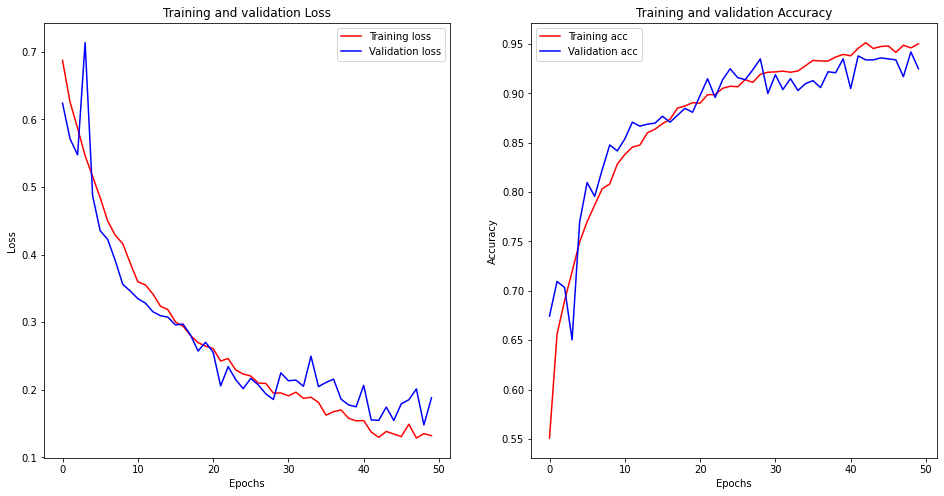

In [137]:
# obtendo o histórico de treinamento através do dataframe
history = pd.read_csv('/content/history_train_oversampling.csv', delimiter = ',',
                       usecols = ['epoch', 'acc', 'loss', 'val_acc', 'val_loss'])

acc = list(history['acc'])
loss = list(history['loss'])
val_acc = list(history['val_acc'])
val_loss = list(history['val_loss'])
epoch = list(history['epoch'])

# plotando o histórico de treinamento do modelo
fig, axes = plt.subplots(1, 2, squeeze = False, figsize = (16,8))

ax = axes.flat[0]
ax.plot(epoch, loss, "r", label = "Training loss")
ax.plot(epoch, val_loss, "b", label = "Validation loss")
ax.set_title("Training and validation Loss")
ax.set_xlabel("Epochs")
ax.set_ylabel("Loss")
ax.legend()

ax = axes.flat[1]
ax.plot(epoch, acc, "r", label = "Training acc")
ax.plot(epoch, val_acc, "b", label = "Validation acc")
ax.set_title("Training and validation Accuracy")
ax.set_xlabel("Epochs")
ax.set_ylabel("Accuracy")
ax.legend()

In [141]:
# carregando os melhores pesos obtidos durante o treinamento
model.load_weights('/content/weights_oversampling.hdf5')
# salvando o modelo treinado
model.save('cats_vs_dogs_model_oversampling')
# compactando o modelo salvo
!zip -r /content/cats_vs_dogs_model_oversampling.zip /content/cats_vs_dogs_model_oversampling

INFO:tensorflow:Assets written to: cats_vs_dogs_model_oversampling/assets
  adding: content/cats_vs_dogs_model_oversampling/ (stored 0%)
  adding: content/cats_vs_dogs_model_oversampling/variables/ (stored 0%)
  adding: content/cats_vs_dogs_model_oversampling/variables/variables.index (deflated 69%)
  adding: content/cats_vs_dogs_model_oversampling/variables/variables.data-00000-of-00001 (deflated 27%)
  adding: content/cats_vs_dogs_model_oversampling/keras_metadata.pb (deflated 93%)
  adding: content/cats_vs_dogs_model_oversampling/assets/ (stored 0%)
  adding: content/cats_vs_dogs_model_oversampling/saved_model.pb (deflated 89%)


## 13. Métricas de Avaliação do Modelo Desenvolvido
***

In [142]:
# calculando a acurácia obtida com o treinamento do modelo  
# OBS: não foi utilizado os pesos recuperados pelo callback checkpoint (~87,50%)
metrics = model.evaluate(test_generator)
print('Loss: {:.2f}\nAcurácia: {:.2f}%'.format(metrics[0], metrics[1] * 100))

16/16 [==============================] - 4s 235ms/step - loss: 0.1901 - acc: 0.9228
Loss: 0.19
Acurácia: 92.28%


In [143]:
# armazenando os dados de teste em arrays multidimensionais
for i in range (0, (len(test_df) // 64) + 1):
  if i == 0:
    x0, y0 = test_generator[i]
  else:
    x, y = test_generator[i]
    x0, y0 = np.concatenate((x0, x)), np.concatenate((y0, y))

In [144]:
# predizendo os rótulos com os dados de teste  
labels_pred = model.predict(x0)

Text(0.5, 1.0, 'Matriz de Confusão')

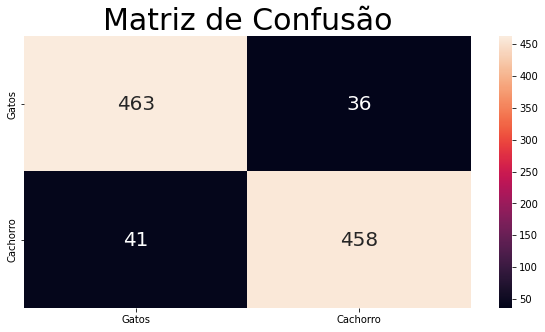

In [145]:
# plotando a matriz de confusão
confusion_ma = confusion_matrix(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis=1))
df_cm = pd.DataFrame(confusion_ma, index = ['Gatos', 'Cachorro'], columns = ['Gatos', 'Cachorro'])
plt.figure(figsize = (10,5))
sn.heatmap(df_cm, annot=True, annot_kws={"size": 20}, fmt='g')
plt.title('Matriz de Confusão', size = 30)

In [146]:
# utilizando métricas de avaliação para analisar o desempenho do algoritmo nas imagens de teste
average = average_precision_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis=1))
precision = precision_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis=1))
recall = recall_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis=1))
f1 = f1_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis=1))

In [147]:
# visualizando as métricas de avalição obtidas com o modelo a partir dos dados de teste
print('Métricas de Avaliação do Modelo:\n--')
print('Average: {:.2f}%'.format(average * 100))
print('Precision: {:.2f}%'.format(precision * 100))
print('Recall: {:.2f}%'.format(recall * 100))
print('F1_score: {:.2f}%'.format(f1 * 100))

Métricas de Avaliação do Modelo:
--
Average: 89.20%
Precision: 92.71%
Recall: 91.78%
F1_score: 92.25%


## 14. Explicabilidade do Modelo (Algoritmo Grad CAM)
***

In [148]:
# visualizando as camadas da arquitetura construída
for layer in model.layers:
  print(layer.name)

input_2
conv2d_4
max_pooling2d_4
conv2d_5
max_pooling2d_5
conv2d_6
max_pooling2d_6
conv2d_7
max_pooling2d_7
flatten_1
dense_4
dense_5
dense_6
dropout_1
dense_7


In [149]:
def format_gradcam(img_path, heatmap, alpha=0.4):
    '''Função que organiza o mapa de calor sobreposto Na imagem original'''

    try:
      img = tf.keras.preprocessing.image.load_img(img_path)
    except:
      img = img_path
    img = tf.keras.preprocessing.image.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)

    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    return jet_heatmap, superimposed_img

In [156]:
def get_grad_cam(img_array, model, last_layer_conv_layer, pred_index):
  '''Função de mapeamento de ativação de classe'''

  mask = make_gradcam_heatmap(img_array = img_array, model = model, last_conv_layer_name = last_layer_conv_layer,
                              pred_index  = pred_index)

  return  format_gradcam(img_path = img_array[0] * 255, heatmap = mask, alpha = 0.4)

Text(0.5, 0.98, 'Primeira Camada Convolucional')

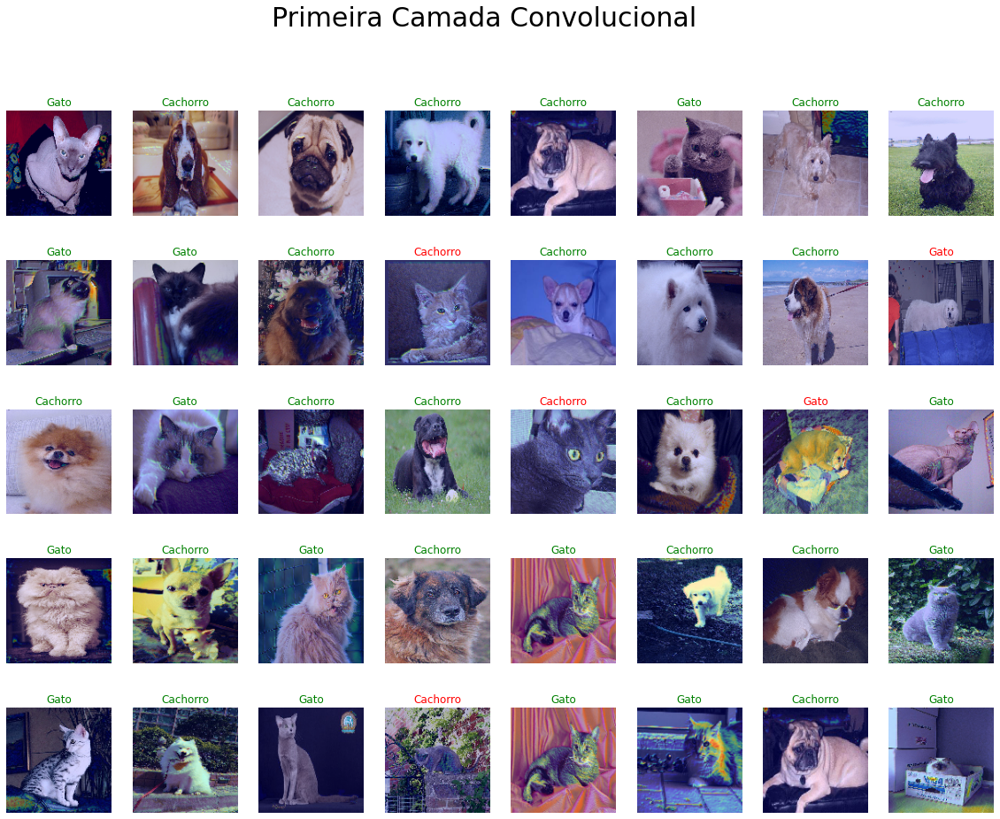

In [159]:
# visualizando o gradiente na primeira camada da rede convolucional
fig, axs = plt.subplots(nrows = 5, ncols = 8, figsize=(20, 15))
for i in range(0, 5):
  for j in range(0, 8):
    count = random.randrange(0, 480)
    image, label = np.reshape(x0[count], (1, 128, 128, 3)), np.argmax(y0[count])
    _, image_with_map = get_grad_cam(image, model, 'conv2d_4', np.argmax(model.predict(image)))
    if np.argmax(model.predict(image)) == label:
      color = 'green'
    else:
      color = 'red'
    axs[i,j].imshow(image_with_map)
    axs[i,j].axis('off')
    axs[i,j].set_title(encode(np.argmax(model.predict(image))), color = color)

plt.suptitle('Primeira Camada Convolucional', size = 30)

Text(0.5, 0.98, 'Segunda Camada Convolucional')

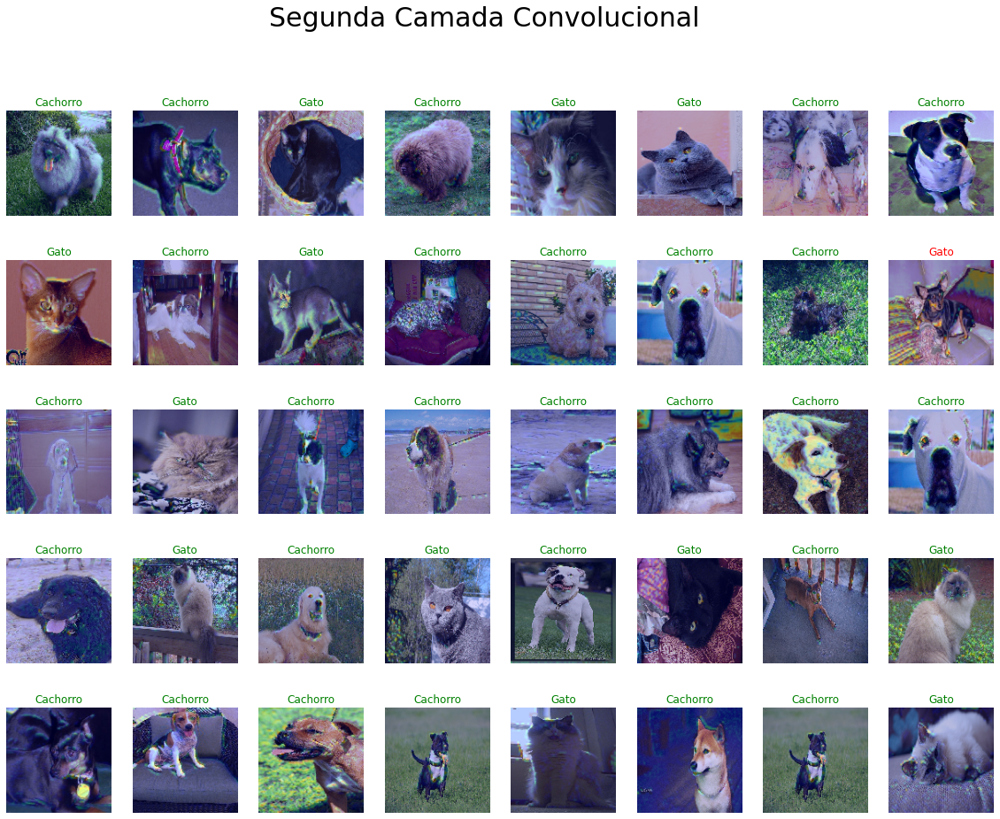

In [160]:
# visualizando o gradiente na segunda camada da rede convolucional
fig, axs = plt.subplots(nrows = 5, ncols = 8, figsize=(20, 15))
for i in range(0, 5):
  for j in range(0, 8):
    count = random.randrange(0, 480)
    image, label = np.reshape(x0[count], (1, 128, 128, 3)), np.argmax(y0[count])
    _, image_with_map = get_grad_cam(image, model, 'conv2d_5', np.argmax(model.predict(image)))
    if np.argmax(model.predict(image)) == label:
      color = 'green'
    else:
      color = 'red'
    axs[i,j].imshow(image_with_map)
    axs[i,j].axis('off')
    axs[i,j].set_title(encode(np.argmax(model.predict(image))), color = color)

plt.suptitle('Segunda Camada Convolucional', size = 30)

Text(0.5, 0.98, 'Terceira Camada Convolucional')

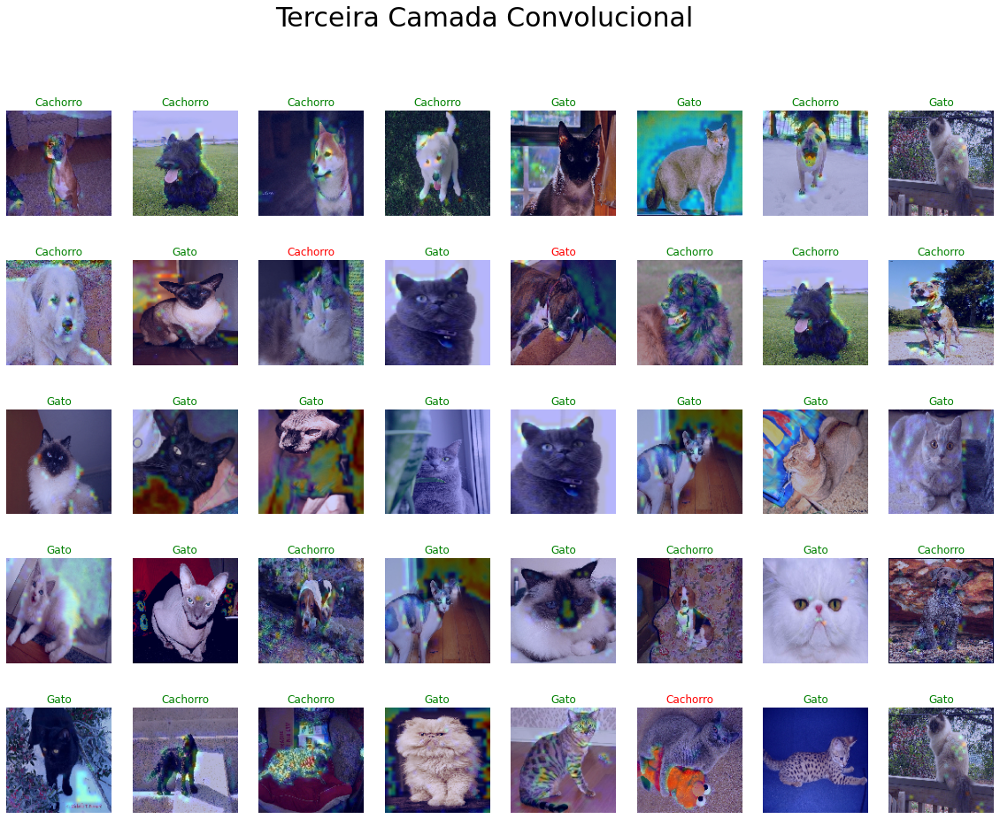

In [161]:
# visualizando o gradiente na terceira camada da rede convolucional
fig, axs = plt.subplots(nrows = 5, ncols = 8, figsize=(20, 15))
for i in range(0, 5):
  for j in range(0, 8):
    count = random.randrange(0, 480)
    image, label = np.reshape(x0[count], (1, 128, 128, 3)), np.argmax(y0[count])
    _, image_with_map = get_grad_cam(image, model, 'conv2d_6', np.argmax(model.predict(image)))
    if np.argmax(model.predict(image)) == label:
      color = 'green'
    else:
      color = 'red'
    axs[i,j].imshow(image_with_map)
    axs[i,j].axis('off')
    axs[i,j].set_title(encode(np.argmax(model.predict(image))), color = color)

plt.suptitle('Terceira Camada Convolucional', size = 30)

Text(0.5, 0.98, 'Quarta Camada Convolucional')

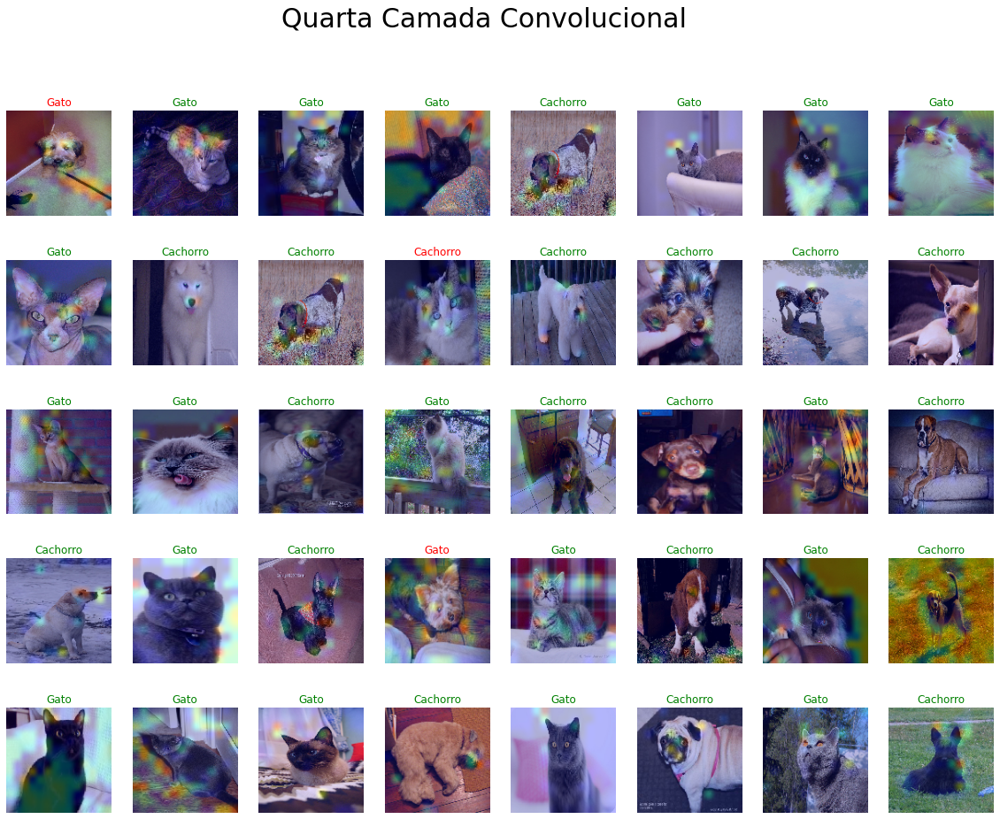

In [163]:
# visualizando o gradiente na quarta camada da rede convolucional
fig, axs = plt.subplots(nrows = 5, ncols = 8, figsize=(20, 15))
for i in range(0, 5):
  for j in range(0, 8):
    count = random.randrange(0, 480)
    image, label = np.reshape(x0[count], (1, 128, 128, 3)), np.argmax(y0[count])
    _, image_with_map = get_grad_cam(image, model, 'conv2d_7', np.argmax(model.predict(image)))
    if np.argmax(model.predict(image)) == label:
      color = 'green'
    else:
      color = 'red'
    axs[i,j].imshow(image_with_map)
    axs[i,j].axis('off')
    axs[i,j].set_title(encode(np.argmax(model.predict(image))), color = color)

plt.suptitle('Quarta Camada Convolucional', size = 30)

## 15. Resultados das Métricas Avaliativas do Modelo
***

|**Conjunto de Dados**|**Acurácia (%)**|
|:-|:-:|
|Treinamento|94,60|
|Validação|94,19|
|Teste|92,28| 

***

|**Métricas de Avaliação**|**Conjunto de Dados de Teste (%)**|
|:-|:-:|
|Average|89.20|
|Precision|92.71|
|Recall|91.78|
|F1_score|92.25|

***
![giphy](https://user-images.githubusercontent.com/58775072/136018534-c65a2442-63ca-401d-9867-a2c35dab0e31.gif)